In [1]:
import numpy as np
import pandas as pd
import scipy
from scipy import stats
import suncalc

import dask.dataframe as dd
from pathlib import Path
import glob

import datetime as dt

import matplotlib.pyplot as plt
from matplotlib import colors
import soundfile as sf
import matplotlib.patches as patches

In [2]:
import sys

sys.path.append("../src")
sys.path.append("../src/activity")

In [3]:
import subsampling as ss
import activity_assembly as actvt
from core import SITE_NAMES, FREQ_GROUPS, SEATTLE_LATITUDE, SEATTLE_LONGITUDE

from cli import get_file_paths
import plot
import pipeline

In [4]:
cycle_lengths = [360, 1800, 16800, 21600, 50400]
percent_ons = [1/6]
specific_dc_tag = "1800of1800"

data_params = dict()
data_params["cycle_lengths"] = cycle_lengths
data_params["percent_ons"] = percent_ons
dc_tags = ss.get_list_of_dc_tags(data_params["cycle_lengths"], data_params["percent_ons"])
data_params["dc_tags"] = dc_tags
data_params["cur_dc_tag"] = specific_dc_tag
data_params['resolution_in_min'] = '30'
data_params['recording_start'] = '00:00'
data_params['recording_end'] = '16:00'

pipeline_params = dict()
pipeline_params['assemble_location_summary'] = False
pipeline_params["read_csv"] = False
pipeline_params["save_activity_grid"] = False
pipeline_params["save_presence_grid"] = False
pipeline_params["save_dc_night_comparisons"] = False
pipeline_params["save_activity_dc_comparisons"] = False
pipeline_params["save_presence_dc_comparisons"] = False
pipeline_params["show_plots"] = True
pipeline_params["show_PST"] = True

In [5]:
# data_params["dc_tags"] = ['7200of50400', '3600of21600', '1800of10800', '1800of5400', '1800of3600', '1800of1800', '300of1800', '60of360']

In [6]:
data_params["dc_tags"] = ['240of1440', '240of720', '240of480', 
                          '120of720', '120of360', '120of240', 
                          '60of360', '60of180', '60of120', 
                          '30of180', '30of90', '30of60', '30of30', 
                          '15of30', '10of30', '5of30', 
                          '3of6', '2of6', '1of6']

In [7]:
# data_params["dc_tags"] = data_params["dc_tags"][::3]

In [8]:
def assemble_initial_location_summary(data_params, file_paths, save=True):
    """
    Puts together all bd2 outputs in data/raw and converts detection start_times to datetime objects.
    Returns and saves a summary of bd2-detected bat calls within a desired frequency band.
    """

    location_df = dd.read_csv(f'{file_paths["raw_SITE_folder"]}/*.csv', dtype=str).compute()
    location_df['low_freq'] = location_df['low_freq'].astype('float')
    location_df['high_freq'] = location_df['high_freq'].astype('float')
    file_dts = pd.to_datetime(location_df['input_file'], format='%Y%m%d_%H%M%S', exact=False)
    anchor_start_times = file_dts + pd.to_timedelta(location_df['start_time'].values.astype('float64'), unit='S')
    anchor_end_times = file_dts + pd.to_timedelta(location_df['end_time'].values.astype('float64'), unit='S')

    location_df.insert(0, 'call_end_time', anchor_end_times)
    location_df.insert(0, 'call_start_time', anchor_start_times)
    location_df.insert(0, 'ref_time', anchor_start_times)
    location_df.insert(0, 'freq_group', '')

    groups = FREQ_GROUPS[data_params['site_tag']]
    blue_group = groups['LF1']
    red_group = groups['HF1']
    yellow_group = groups['HF2']

    call_is_yellow = (location_df['low_freq']>=yellow_group[0])&(location_df['high_freq']<=yellow_group[1])
    call_is_red = (location_df['low_freq']>=red_group[0])&(location_df['high_freq']<=red_group[1])
    call_is_blue = (location_df['low_freq']>=blue_group[0])&(location_df['high_freq']<=blue_group[1])

    location_df.loc[call_is_yellow, 'freq_group'] = 'HF2'
    location_df.loc[call_is_red&(~(call_is_yellow)), 'freq_group'] = 'HF1'
    location_df.loc[call_is_blue&(~(call_is_red | call_is_yellow)), 'freq_group'] = 'LF1'

    if data_params['type_tag'] != '':
        location_df = location_df.loc[location_df['freq_group']==data_params['type_tag']]

    if save:
        location_df.to_csv(f'{file_paths["SITE_folder"]}/{file_paths["bd2_TYPE_SITE_YEAR"]}.csv')

    return location_df

def get_number_of_detections_per_interval(location_df, data_params):
    """
    Constructs a pandas Series that records the # of detections observed per interval.
    The used interval is the one stored inside data_params['resolution_in_min']
    """

    location_df.insert(0, 'call_durations', (location_df['call_end_time'] - location_df['call_start_time']))
    df_resampled_every_30 = location_df.resample(f"{data_params['resolution_in_min']}T", on='ref_time')
    num_of_detections = df_resampled_every_30['ref_time'].count()

    return num_of_detections

def construct_activity_arr_from_location_summary(num_of_detections, dc_tag, file_paths, data_params):
    """
    Construct an activity summary of the number of detections recorded per date and time interval.
    Will be used later to assemble an activity summary for each duty-cycling scheme to compare effects.
    """

    all_processed_filepaths = sorted(list(map(str, list(Path(f'{file_paths["raw_SITE_folder"]}').glob('*.csv')))))
    all_processed_datetimes = pd.to_datetime(all_processed_filepaths, format="%Y%m%d_%H%M%S", exact=False)
    col_name = f"num_dets ({dc_tag})"
    incomplete_activity_arr = pd.DataFrame(num_of_detections.values, index=num_of_detections.index, columns=[col_name])
    activity_arr = incomplete_activity_arr.reindex(index=all_processed_datetimes, fill_value=0).resample(f"{data_params['resolution_in_min']}T").first()
    activity_arr = activity_arr.between_time(data_params['recording_start'], data_params['recording_end'], inclusive='left')

    return pd.DataFrame(list(zip(activity_arr.index, activity_arr[col_name].values)), columns=["datetime_UTC", col_name])

def generate_activity_dets_results(data_params, file_paths, save=True):
    """
    Generates an activity summary using the detected calls for each provided duty-cycling scheme and puts them together for comparison.
    A summary of activity is formatted as the number of detected bat calls per time interval.
    """

    activity_dets_arr = pd.DataFrame()

    for dc_tag in data_params['dc_tags']:

        location_df = ss.prepare_summary_for_plotting_with_duty_cycle(file_paths, dc_tag)
        num_of_detections = get_number_of_detections_per_interval(location_df, data_params)
        dc_dets = construct_activity_arr_from_location_summary(num_of_detections, dc_tag, file_paths, data_params)
        dc_dets = dc_dets.set_index("datetime_UTC")
        activity_dets_arr = pd.concat([activity_dets_arr, dc_dets], axis=1)

    if save:
        activity_dets_arr.to_csv(f'{file_paths["duty_cycled_folder"]}/{file_paths["dc_dets_TYPE_SITE_summary"]}.csv')

    return activity_dets_arr

In [9]:
def simulate_dutycycle_on_detections(location_df, dc_tag):
    """
    Simulates a provided duty-cycling scheme on the provided location summary of concatenated bd2 outputs.
    """

    cycle_length = int(dc_tag.split('of')[1])
    time_on = int(dc_tag.split('of')[0])

    location_df['ref_time'] = pd.DatetimeIndex(location_df['call_start_time'])
    location_df['call_end_time'] = pd.DatetimeIndex(location_df['call_end_time'])
    location_df['call_start_time'] = pd.DatetimeIndex(location_df['call_start_time'])
    
    resampled_df = location_df.resample(f'{cycle_length}S', on='ref_time')
    location_df['ref_time'] = resampled_df['ref_time'].transform(lambda x: x.name)
    location_df.insert(0, 'end_time_wrt_ref', (location_df['call_end_time'] - location_df['ref_time']).dt.total_seconds())
    location_df.insert(0, 'start_time_wrt_ref', (location_df['call_start_time'] - location_df['ref_time']).dt.total_seconds())

    dc_applied_df = location_df.loc[(location_df['end_time_wrt_ref'] <= time_on)&(location_df['start_time_wrt_ref'] >= 0)]

    return dc_applied_df

def prepare_summary_for_plotting_with_duty_cycle(file_paths, dc_tag):
    """
    Generates a duty-cycled location summary of concatenated bd2 outputs for measuring effects of duty-cycling.
    """

    location_df = pd.read_csv(f'{file_paths["SITE_folder"]}/{file_paths["bd2_TYPE_SITE_YEAR"]}.csv', low_memory=False, index_col=0)
    plottable_location_df = simulate_dutycycle_on_detections(location_df, dc_tag)
    plottable_location_df.to_csv(f'{file_paths["simulated_schemes_folder"]}/{file_paths["bd2_TYPE_SITE_YEAR"]}_{dc_tag}.csv')

    return plottable_location_df

In [10]:
site_key = 'Telephone'
type_key = ''
print(site_key, type_key)

data_params["site_name"] = SITE_NAMES[site_key]
data_params["site_tag"] = site_key
data_params["type_tag"] = type_key

file_paths = get_file_paths(data_params)

if (pipeline_params['assemble_location_summary']):
    assemble_initial_location_summary(data_params, file_paths) ## Use to update any bd2__(location summary).csv files

activity_dets_arr = pd.DataFrame()

for dc_tag in data_params['dc_tags']:
    # dc_tag = '60of180'

    location_df = pd.read_csv(f'{file_paths["SITE_folder"]}/{file_paths["bd2_TYPE_SITE_YEAR"]}.csv', low_memory=False, index_col=0)
    cycle_length = int(dc_tag.split('of')[1])
    time_on = int(dc_tag.split('of')[0])

    location_df['ref_time'] = pd.DatetimeIndex(location_df['call_start_time'])
    location_df['cycle_ref_time'] = pd.DatetimeIndex(location_df['call_start_time'])
    location_df['call_end_time'] = pd.DatetimeIndex(location_df['call_end_time'])
    location_df['call_start_time'] = pd.DatetimeIndex(location_df['call_start_time'])

    print(f'Looking at {time_on}min ON every {cycle_length}min')

    resampled_cycle_length_df = location_df.resample(f'{cycle_length}T', on='cycle_ref_time', origin='start_day')
    location_df['cycle_ref_time'] = pd.DatetimeIndex(resampled_cycle_length_df['cycle_ref_time'].transform(lambda x: x.name))

    resampled_bin_df = location_df.resample(f'{data_params["resolution_in_min"]}T', on='ref_time', origin='start_day')
    location_df['ref_time'] = pd.DatetimeIndex(resampled_bin_df['ref_time'].transform(lambda x: x.name))

    location_df.insert(0, 'end_time_wrt_ref', (location_df['call_end_time'] - location_df['cycle_ref_time']).dt.total_seconds())
    location_df.insert(0, 'start_time_wrt_ref', (location_df['call_start_time'] - location_df['cycle_ref_time']).dt.total_seconds())
    dc_applied_df = location_df.loc[(location_df['end_time_wrt_ref'] <= (60*time_on))&(location_df['start_time_wrt_ref'] >= 0)].copy()
    df_resampled_every_30 = dc_applied_df.resample(f"{data_params['resolution_in_min']}T", on='ref_time')
    num_of_detections = df_resampled_every_30['ref_time'].count()

    dc_dets = construct_activity_arr_from_location_summary(num_of_detections, dc_tag, file_paths, data_params)
    dc_dets = dc_dets.set_index("datetime_UTC")
    activity_dets_arr = pd.concat([activity_dets_arr, dc_dets], axis=1)


activity_dets_arr

Telephone 
Looking at 240min ON every 1440min
Looking at 240min ON every 720min
Looking at 240min ON every 480min
Looking at 120min ON every 720min
Looking at 120min ON every 360min
Looking at 120min ON every 240min
Looking at 60min ON every 360min
Looking at 60min ON every 180min
Looking at 60min ON every 120min
Looking at 30min ON every 180min
Looking at 30min ON every 90min
Looking at 30min ON every 60min
Looking at 30min ON every 30min
Looking at 15min ON every 30min
Looking at 10min ON every 30min
Looking at 5min ON every 30min
Looking at 3min ON every 6min
Looking at 2min ON every 6min
Looking at 1min ON every 6min


,num_dets (240of1440),num_dets (240of720),num_dets (240of480),num_dets (120of720),num_dets (120of360),num_dets (120of240),num_dets (60of360),num_dets (60of180),num_dets (60of120),num_dets (30of180),num_dets (30of90),num_dets (30of60),num_dets (30of30),num_dets (15of30),num_dets (10of30),num_dets (5of30),num_dets (3of6),num_dets (2of6),num_dets (1of6)
datetime_UTC,,,,,,,,,,,,,,,,,,,
2022-07-23 00:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-07-23 00:30:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-07-23 01:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-07-23 01:30:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-07-23 02:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-17 13:30:00,0.0,638.0,0.0,638.0,638.0,638.0,0.0,0.0,0.0,0.0,638.0,0.0,638.0,583.0,339.0,118.0,379.0,238.0,205.0
2022-10-17 14:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-10-17 14:30:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [11]:
activity_dets_arr[2752:]

,num_dets (240of1440),num_dets (240of720),num_dets (240of480),num_dets (120of720),num_dets (120of360),num_dets (120of240),num_dets (60of360),num_dets (60of180),num_dets (60of120),num_dets (30of180),num_dets (30of90),num_dets (30of60),num_dets (30of30),num_dets (15of30),num_dets (10of30),num_dets (5of30),num_dets (3of6),num_dets (2of6),num_dets (1of6)
datetime_UTC,,,,,,,,,,,,,,,,,,,
2022-10-17 00:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-10-17 00:30:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-10-17 01:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-10-17 01:30:00,184.0,184.0,184.0,184.0,184.0,184.0,0.0,0.0,0.0,0.0,184.0,0.0,184.0,0.0,0.0,0.0,138.0,117.0,102.0
2022-10-17 02:00:00,1205.0,1205.0,1205.0,0.0,0.0,0.0,0.0,0.0,1205.0,0.0,0.0,1205.0,1205.0,227.0,106.0,57.0,709.0,431.0,48.0
2022-10-17 02:30:00,2724.0,2724.0,2724.0,0.0,0.0,0.0,0.0,0.0,2724.0,0.0,0.0,0.0,2724.0,805.0,535.0,361.0,1526.0,965.0,599.0
2022-10-17 03:00:00,1986.0,1986.0,1986.0,0.0,0.0,0.0,0.0,1986.0,0.0,1986.0,1986.0,1986.0,1986.0,1054.0,393.0,151.0,871.0,671.0,273.0
2022-10-17 03:30:00,5438.0,5438.0,5438.0,0.0,0.0,0.0,0.0,5438.0,0.0,0.0,0.0,0.0,5438.0,2910.0,2167.0,1117.0,2668.0,1949.0,1031.0
2022-10-17 04:00:00,0.0,0.0,0.0,0.0,0.0,1701.0,0.0,0.0,1701.0,0.0,0.0,1701.0,1701.0,951.0,726.0,491.0,956.0,745.0,502.0


In [115]:
def construct_activity_grid_for_number_of_dets(activity_arr, dc_tag, resolution):
    """
    Reshapes a provided activity summary column to make a grid with date columns and time rows.
    This grid is the one we provide to our activity plotting functions.
    """

    cycle_length = int(dc_tag.split('of')[1])
    time_on = int(dc_tag.split('of')[0])

    activity_datetimes = pd.to_datetime(activity_arr.index.values)
    raw_dates = activity_datetimes.strftime("%m/%d/%y")
    raw_times = activity_datetimes.strftime("%H:%M")

    col_name = f"num_dets ({dc_tag})"
    data = list(zip(raw_dates, raw_times, activity_arr[col_name]))
    activity = pd.DataFrame(data, columns=["Date (UTC)", "Time (UTC)", col_name])
    activity_df = activity.pivot(index="Time (UTC)", columns="Date (UTC)", values=col_name)
    if cycle_length > resolution:
        activity_df = activity_df.replace(np.NaN, -1).replace(0, np.NaN)
        s1, s2 = activity_df.ffill(), activity_df.bfill()
        activity_df = s1.mask(s1.isna() | s2.isna())
        activity_df = activity_df.replace(np.NaN, 0).replace(-1, np.NaN)
    
    return activity_df

In [116]:
data_params['cur_dc_tag'] = '120of360'
dc_tag = data_params['cur_dc_tag']
cycle_length = int(dc_tag.split('of')[1])
time_on = int(dc_tag.split('of')[0])
activity_df = construct_activity_grid_for_number_of_dets(activity_dets_arr, dc_tag, int(data_params['resolution_in_min']))
activity_df

Date (UTC),07/23/22,07/24/22,07/25/22,07/26/22,07/27/22,07/28/22,07/29/22,07/30/22,07/31/22,08/01/22,...,10/08/22,10/09/22,10/10/22,10/11/22,10/12/22,10/13/22,10/14/22,10/15/22,10/16/22,10/17/22
Time (UTC),,,,,,,,,,,,,,,,,,,,,
00:00,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
00:30,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
01:00,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
01:30,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,1.0,0.0,0.0,43.0,0.0,51.0,184.0
02:00,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,1.0,0.0,0.0,43.0,0.0,51.0,184.0
02:30,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,1.0,0.0,0.0,43.0,0.0,51.0,184.0
03:00,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,1.0,0.0,0.0,43.0,0.0,51.0,184.0
03:30,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,1.0,0.0,0.0,43.0,0.0,51.0,184.0
04:00,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,1.0,0.0,0.0,43.0,0.0,51.0,184.0


In [117]:
def plot_activity_grid_for_dets1(activity_arr, data_params, pipeline_params, file_paths):
    """
    Plots an activity grid generated from an activity summary for a specific duty-cycling scheme.
    The activity summary here is of the number of detections observed per date and time interval.
    """
    activity_df = actvt.construct_activity_grid_for_number_of_dets(activity_arr, data_params["cur_dc_tag"])

    activity_times = pd.DatetimeIndex(activity_df.index).tz_localize('UTC')
    activity_dates = pd.DatetimeIndex(activity_df.columns).strftime("%m/%d/%y")
    ylabel = 'UTC'
    if pipeline_params["show_PST"]:
        activity_times = activity_times.tz_convert(tz='US/Pacific')
        ylabel = 'PST'
    activity_times = activity_times.strftime("%H:%M")
    plot_times = [''] * len(activity_times)
    plot_times[::3] = activity_times[::3]
    plot_dates = [''] * len(activity_dates)
    plot_dates[::7] = activity_dates[::7]

    dates_for_sunrise_sunset = pd.to_datetime(activity_df.columns.values, format='%m/%d/%y')
    activity_lat = [SEATTLE_LATITUDE]*len(dates_for_sunrise_sunset)
    activity_lon = [SEATTLE_LONGITUDE]*len(dates_for_sunrise_sunset)
    sunrise_time = pd.DatetimeIndex(suncalc.get_times(dates_for_sunrise_sunset, activity_lon, activity_lat)['sunrise_end'])
    sunset_time = pd.DatetimeIndex(suncalc.get_times(dates_for_sunrise_sunset, activity_lon, activity_lat)['sunset_start'])
    sunrise_seconds_from_midnight = sunrise_time.hour * 3600 + sunrise_time.minute*60 + sunrise_time.second
    sunset_seconds_from_midnight = sunset_time.hour * 3600 + sunset_time.minute*60 + sunset_time.second

    on = int(data_params['cur_dc_tag'].split('of')[0])
    total = int(data_params['cur_dc_tag'].split('of')[1])
    if on >= int(data_params['resolution_in_min']):
        recover_ratio =  1
    else:
        recover_ratio = total / on

    print(recover_ratio)

    masked_array_for_nodets = np.ma.masked_where(activity_df.values==np.NaN, activity_df.values)
    cmap = plt.get_cmap('viridis')
    cmap.set_bad(color='red')
    plt.rcParams.update({'font.size': (0.6*len(activity_dates) + 0.6*len(activity_times))})
    plt.figure(figsize=(0.9*len(activity_dates), 0.9*len(activity_times)))
    title = f"{data_params['type_tag']} Activity (# of calls) from {data_params['site_name']} ({data_params['cur_dc_tag']})"
    plt.title(title, fontsize=0.8*len(activity_dates) + 1.4*len(activity_times))
    plt.imshow(1+(recover_ratio*masked_array_for_nodets), cmap=cmap, norm=colors.LogNorm(vmin=1, vmax=10e3))
    plt.plot(np.arange(0, len(plot_dates)), ((sunset_seconds_from_midnight / (30*60)) % len(plot_times)) - 0.5, 
            color='white', linewidth=0.5*len(activity_times), linestyle='dashed', label=f'Time of Sunset')
    plt.axhline(y=np.where(activity_times=='00:00')[0]-0.5, linewidth=0.5*len(activity_times), linestyle='dashed', color='white', label='Midnight 0:00 PST')
    plt.plot(np.arange(0, len(plot_dates)), ((sunrise_seconds_from_midnight / (30*60)) % len(plot_times)) - 0.5, 
            color='white', linewidth=0.5*len(activity_times), linestyle='dashed', label=f'Time of Sunrise')
    plt.yticks(np.arange(0, len(activity_df.index))-0.5, plot_times, rotation=30)
    plt.xticks(np.arange(0, len(activity_df.columns))-0.5, plot_dates, rotation=30)
    plt.ylabel(f'{ylabel} Time (HH:MM)')
    plt.xlabel('Date (MM/DD/YY)')
    plt.grid(which='both', linewidth=2)
    plt.legend(loc=3, ncol=3, fontsize=0.7*len(activity_dates) + 1*len(activity_times))
    plt.colorbar()
    plt.tight_layout()
    if pipeline_params["save_activity_grid"]:
        plt.savefig(f'{file_paths["activity_grid_folder"]}/{file_paths["activity_dets_grid_figname"]}.png', bbox_inches='tight')
        plt.close()
    if pipeline_params["show_plots"]:
        plt.show()

def plot_activity_grid_for_dets2(activity_arr, data_params, pipeline_params, file_paths):
    """
    Plots an activity grid generated from an activity summary for a specific duty-cycling scheme.
    The activity summary here is of the number of detections observed per date and time interval.
    """
    activity_df = construct_activity_grid_for_number_of_dets(activity_arr, data_params["cur_dc_tag"], int(data_params['resolution_in_min']))

    activity_times = pd.DatetimeIndex(activity_df.index).tz_localize('UTC')
    activity_dates = pd.DatetimeIndex(activity_df.columns).strftime("%m/%d/%y")
    ylabel = 'UTC'
    if pipeline_params["show_PST"]:
        activity_times = activity_times.tz_convert(tz='US/Pacific')
        ylabel = 'PST'
    activity_times = activity_times.strftime("%H:%M")
    plot_times = [''] * len(activity_times)
    plot_times[::3] = activity_times[::3]
    plot_dates = [''] * len(activity_dates)
    plot_dates[::7] = activity_dates[::7]

    dates_for_sunrise_sunset = pd.to_datetime(activity_df.columns.values, format='%m/%d/%y')
    activity_lat = [SEATTLE_LATITUDE]*len(dates_for_sunrise_sunset)
    activity_lon = [SEATTLE_LONGITUDE]*len(dates_for_sunrise_sunset)
    sunrise_time = pd.DatetimeIndex(suncalc.get_times(dates_for_sunrise_sunset, activity_lon, activity_lat)['sunrise_end'])
    sunset_time = pd.DatetimeIndex(suncalc.get_times(dates_for_sunrise_sunset, activity_lon, activity_lat)['sunset_start'])
    sunrise_seconds_from_midnight = sunrise_time.hour * 3600 + sunrise_time.minute*60 + sunrise_time.second
    sunset_seconds_from_midnight = sunset_time.hour * 3600 + sunset_time.minute*60 + sunset_time.second

    on = int(data_params['cur_dc_tag'].split('of')[0])
    total = int(data_params['cur_dc_tag'].split('of')[1])
    if on >= int(data_params['resolution_in_min']):
        recover_ratio =  1
    else:
        recover_ratio = total / on

    print(recover_ratio)

    masked_array_for_nodets = np.ma.masked_where(activity_df.values==np.NaN, activity_df.values)
    cmap = plt.get_cmap('viridis')
    cmap.set_bad(color='red')
    plt.rcParams.update({'font.size': (0.6*len(activity_dates) + 0.6*len(activity_times))})
    plt.figure(figsize=(0.9*len(activity_dates), 0.9*len(activity_times)))
    title = f"{data_params['type_tag']} Activity (# of calls) from {data_params['site_name']} ({data_params['cur_dc_tag']})"
    plt.title(title, fontsize=0.8*len(activity_dates) + 1.4*len(activity_times))
    plt.imshow(1+(recover_ratio*masked_array_for_nodets), cmap=cmap, norm=colors.LogNorm(vmin=1, vmax=10e3))
    plt.plot(np.arange(0, len(plot_dates)), ((sunset_seconds_from_midnight / (30*60)) % len(plot_times)) - 0.5, 
            color='white', linewidth=0.5*len(activity_times), linestyle='dashed', label=f'Time of Sunset')
    plt.axhline(y=np.where(activity_times=='00:00')[0]-0.5, linewidth=0.5*len(activity_times), linestyle='dashed', color='white', label='Midnight 0:00 PST')
    plt.plot(np.arange(0, len(plot_dates)), ((sunrise_seconds_from_midnight / (30*60)) % len(plot_times)) - 0.5, 
            color='white', linewidth=0.5*len(activity_times), linestyle='dashed', label=f'Time of Sunrise')
    plt.yticks(np.arange(0, len(activity_df.index))-0.5, plot_times, rotation=30)
    plt.xticks(np.arange(0, len(activity_df.columns))-0.5, plot_dates, rotation=30)
    plt.ylabel(f'{ylabel} Time (HH:MM)')
    plt.xlabel('Date (MM/DD/YY)')
    plt.grid(which='both', linewidth=2)
    plt.legend(loc=3, ncol=3, fontsize=0.7*len(activity_dates) + 1*len(activity_times))
    plt.colorbar()
    plt.tight_layout()
    if pipeline_params["save_activity_grid"]:
        plt.savefig(f'{file_paths["activity_grid_folder"]}/{file_paths["activity_dets_grid_figname"]}.png', bbox_inches='tight')
        plt.close()
    if pipeline_params["show_plots"]:
        plt.show()

1


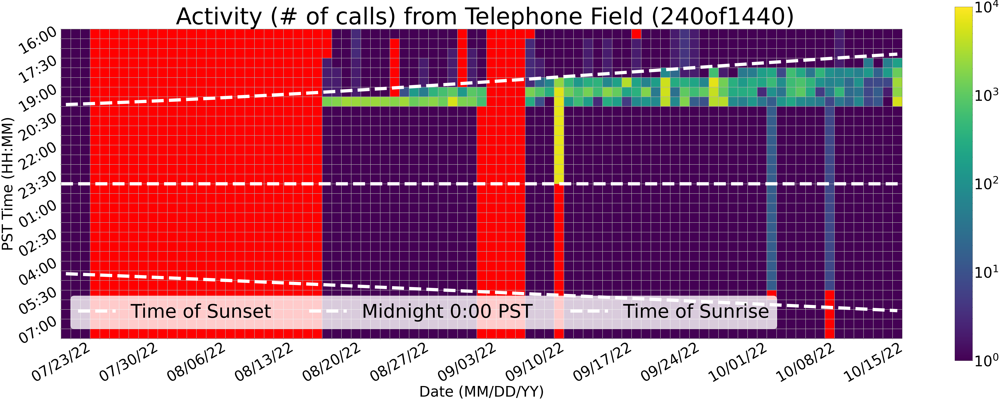

1


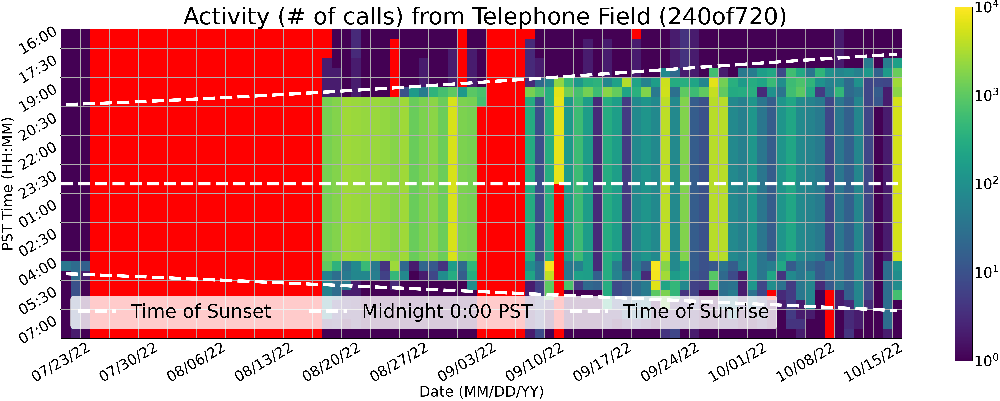

1


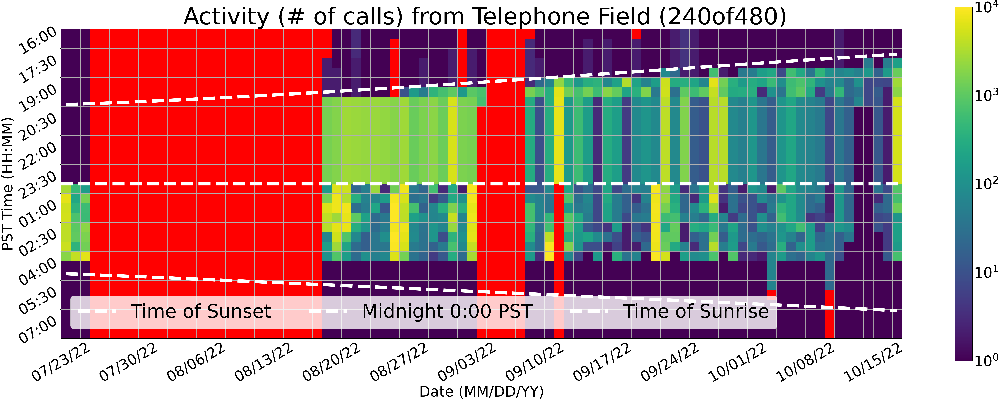

1


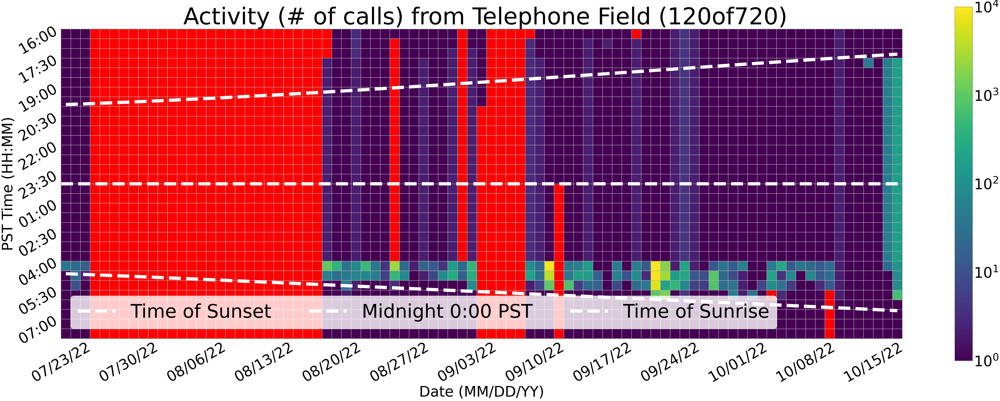

1


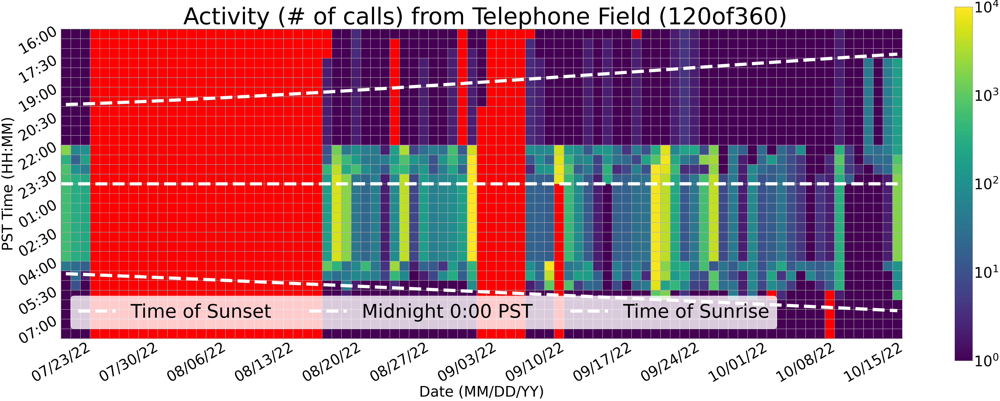

1


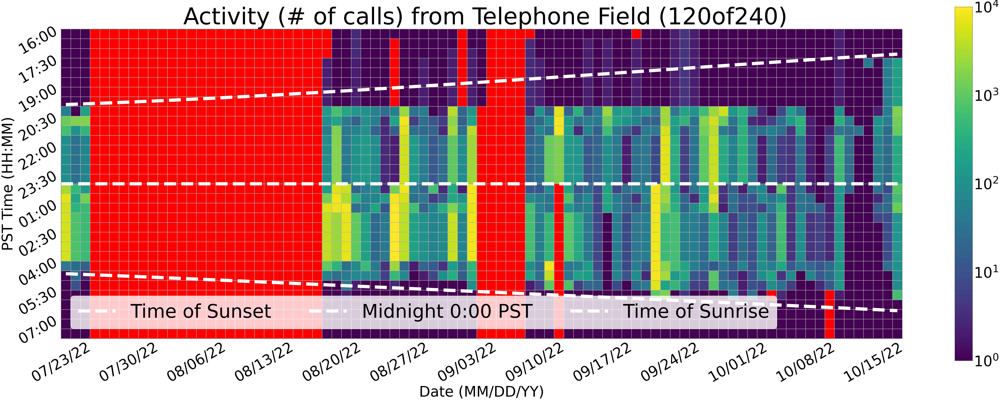

1


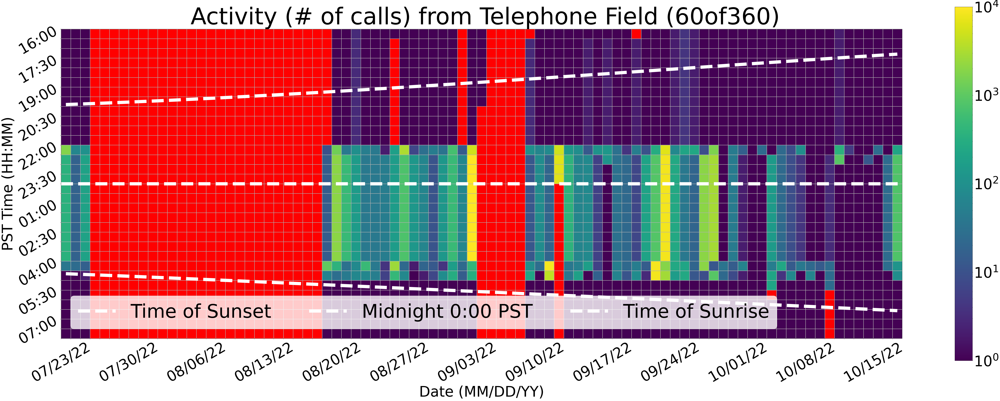

1


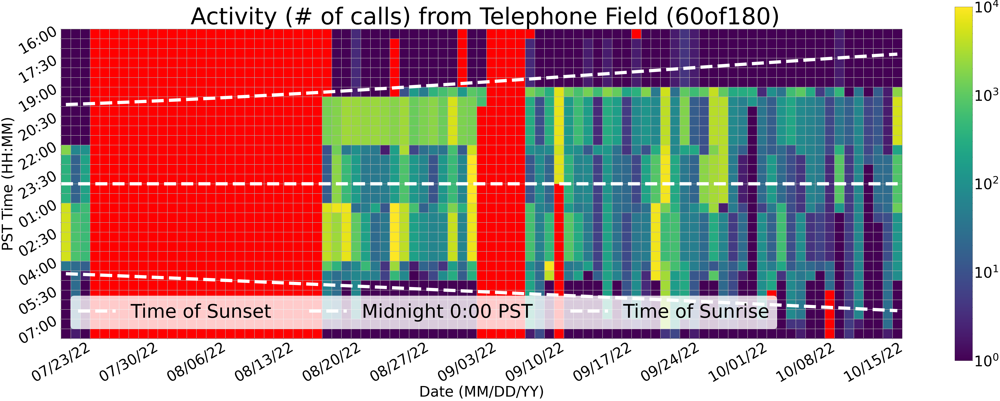

1


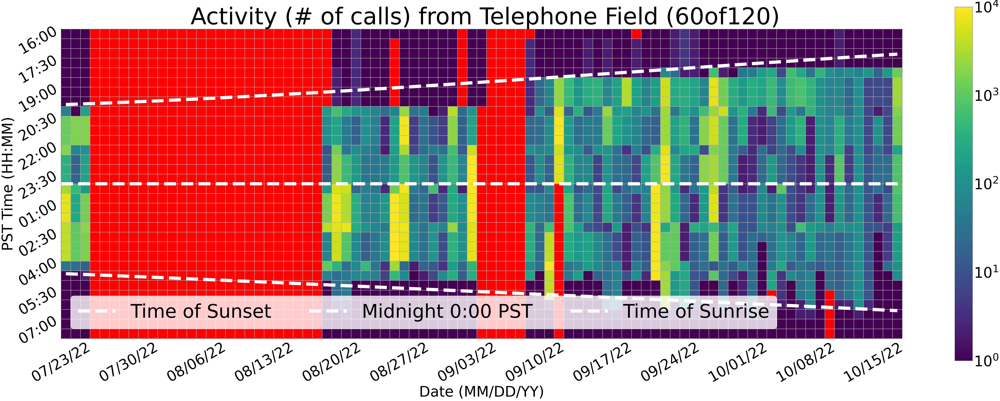

1


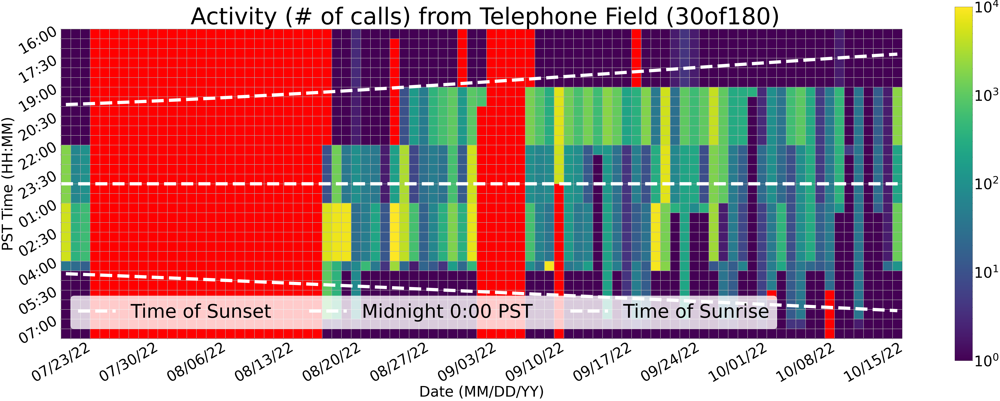

1


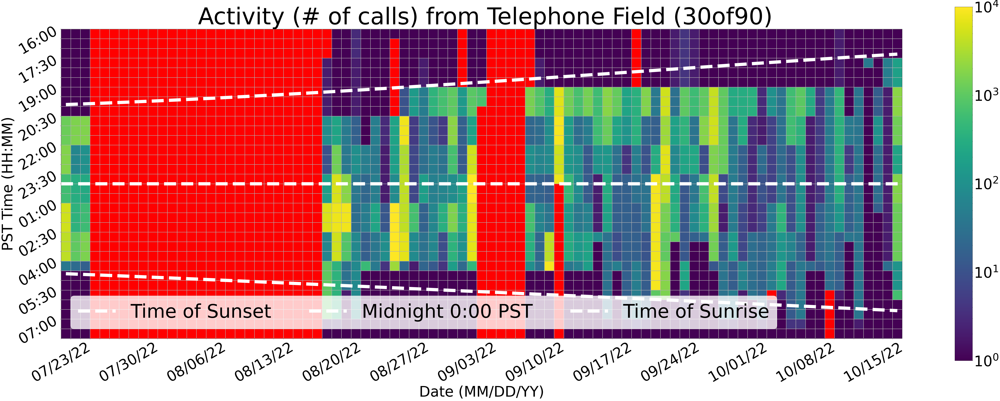

1


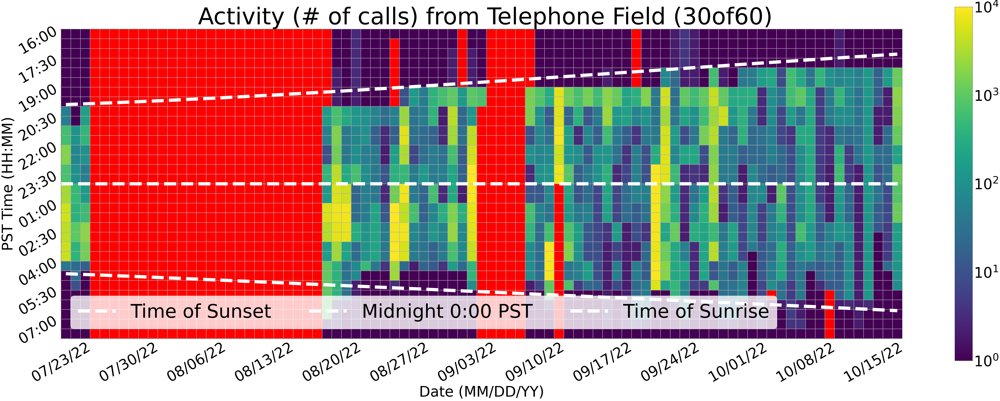

1


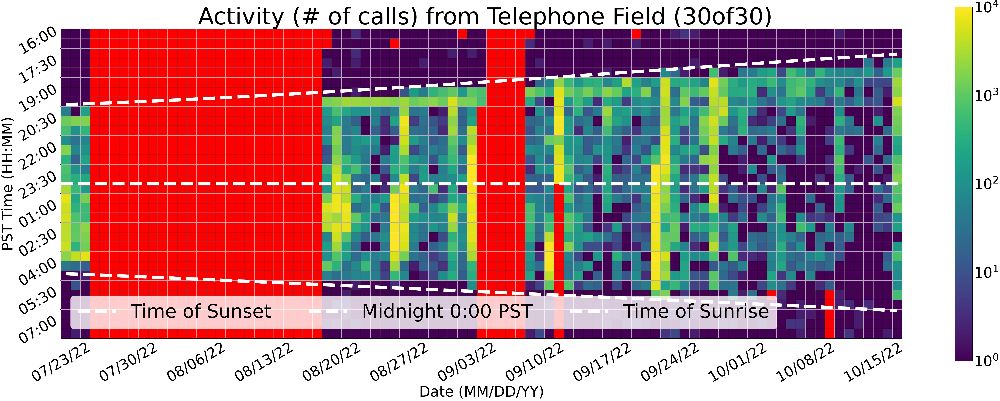

2.0


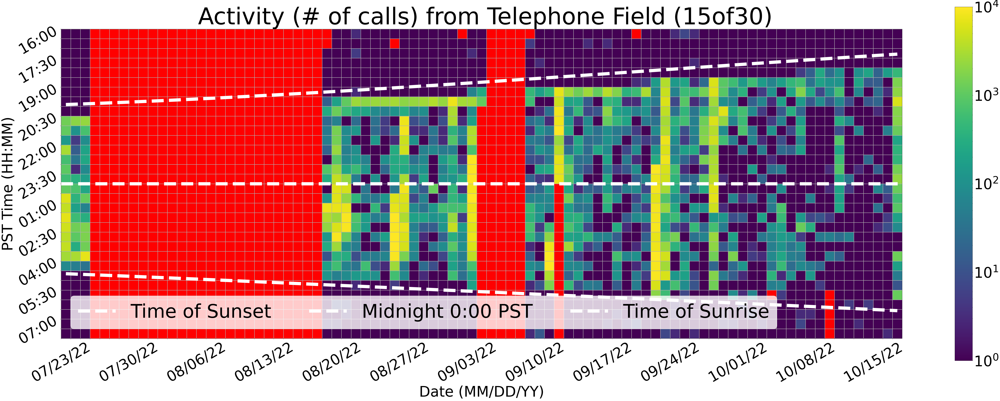

3.0


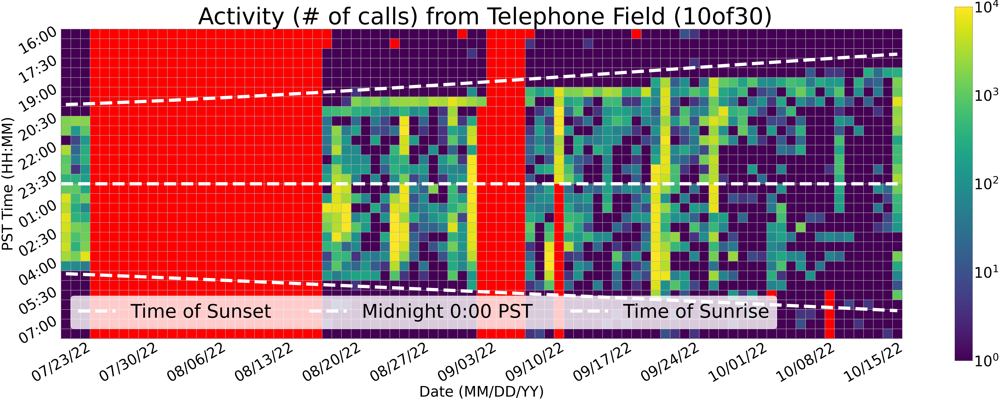

6.0


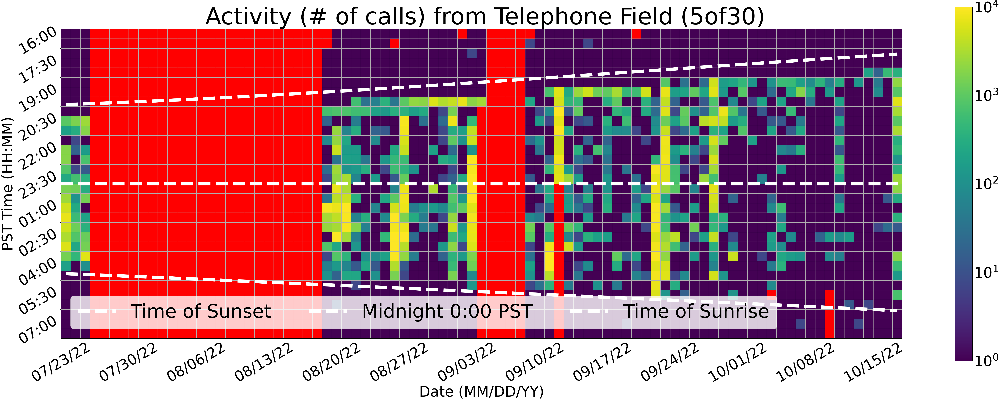

2.0


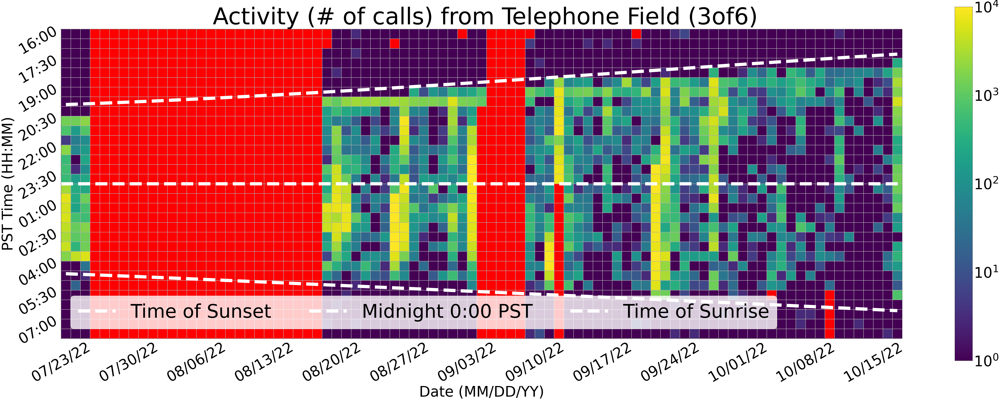

3.0


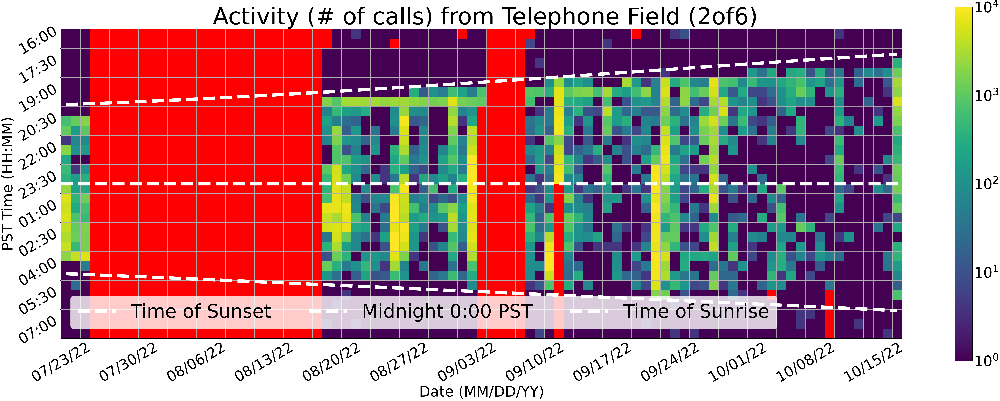

6.0


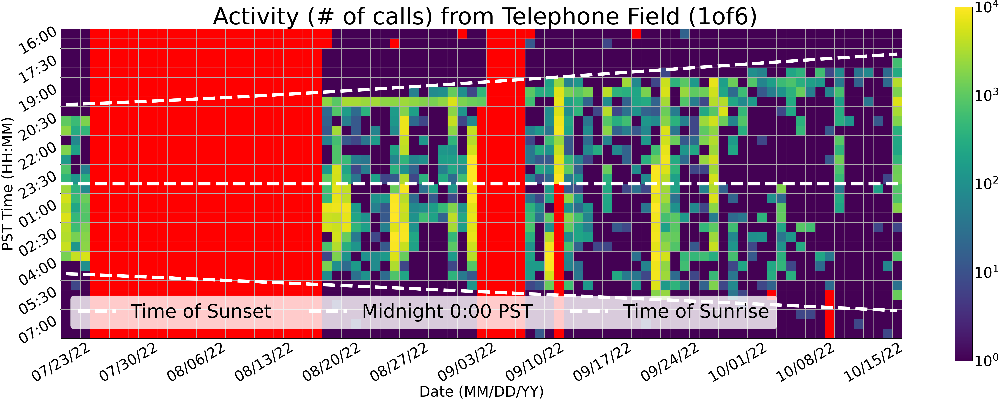

In [118]:
for dc_tag in data_params['dc_tags']:
    data_params["cur_dc_tag"] = dc_tag
    # plot_activity_grid_for_dets1(activity_dets_arr, data_params, pipeline_params, file_paths)
    plot_activity_grid_for_dets2(activity_dets_arr, data_params, pipeline_params, file_paths)